<center><h1>Wang_Timothy_HW4</h1></center>
<br>
<br>

Name: Timothy Wang
<br>
Github Username: timothyswang
<br>
USC ID: 2697040790

## 1. Time Series Classification Part 1: Feature Creation/Extraction (HW3 Rerun)

### (a) Obtain Data

Import packages

In [345]:
import os
import pandas as pd
import numpy as np
import seaborn
import random
import statsmodels
import copy
#[4]
import statsmodels.api as stat
from sklearn import datasets
from sklearn.feature_selection import RFE
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import StratifiedKFold
from sklearn.linear_model import LogisticRegressionCV
from sklearn import metrics
from sklearn import preprocessing
from sklearn import pipeline
from sklearn.preprocessing import LabelBinarizer
from sklearn.preprocessing import label_binarize
from scipy.stats import bootstrap
from sklearn.naive_bayes import GaussianNB
from sklearn.naive_bayes import MultinomialNB
# import bootstrapped.bootstrap as boot
# import bootstrapped.stats_functions as bootstrap_stat

# bootstrapped.bootstrap

Get the AReM Data Set

In [131]:
directory_bending1 = "../data/AReM/bending1"
directory_bending2 = "../data/AReM/bending2"
directory_cycling = "../data/AReM/cycling"
directory_lying = "../data/AReM/lying"
directory_sitting = "../data/AReM/sitting"
directory_standing = "../data/AReM/standing"
directory_walking = "../data/AReM/walking"

### (b) Splitting Data

In [314]:
data_test = []
data_train = []
data_all = []

bending_test = []
bending_train = []
not_bending_test = []
not_bending_train = []

cycling_test = []
cycling_train = []

lying_test = []
lying_train = []

sitting_test = []
sitting_train = []

standing_test = []
standing_train = []

walking_test = []
walking_train = []

#[1]
for this_file in os.listdir(directory_bending1):
    path_this_file = directory_bending1 + "/" + this_file
    #[2]
    df_this_file = pd.read_csv(path_this_file)

    if this_file == "dataset1.csv" or this_file == "dataset2.csv":
        # print(this_file)
        data_test.append(df_this_file)
        bending_test.append(df_this_file)
    else:
        data_train.append(df_this_file)
        bending_train.append(df_this_file)

        # print(this_file)
    data_all.append(df_this_file)

#[1]
for this_file in os.listdir(directory_bending2):
    path_this_file = directory_bending2 + "/" + this_file

    #[2]
    df_this_file = pd.read_csv(path_this_file)

    if this_file == "dataset1.csv" or this_file == "dataset2.csv":
        # print(this_file)
        data_test.append(df_this_file)
        bending_test.append(df_this_file)

    else:
        data_train.append(df_this_file)
        bending_train.append(df_this_file)

        # print(this_file)

    data_all.append(df_this_file)

#[1]
for this_file in os.listdir(directory_cycling):
    path_this_file = directory_cycling + "/" + this_file

    #[2]
    df_this_file = pd.read_csv(path_this_file)

    if this_file == "dataset1.csv" or this_file == "dataset2.csv" or this_file == "dataset3.csv":
        # print(this_file)
        data_test.append(df_this_file)
        not_bending_test.append(df_this_file)
        cycling_test.append(df_this_file)

    else:
        data_train.append(df_this_file)
        not_bending_train.append(df_this_file)
        cycling_train.append(df_this_file)
        # print(this_file)

    data_all.append(df_this_file)

#[1]
for this_file in os.listdir(directory_lying):
    path_this_file = directory_lying + "/" + this_file

    #[2]
    df_this_file = pd.read_csv(path_this_file)

    if this_file == "dataset1.csv" or this_file == "dataset2.csv" or this_file == "dataset3.csv":
        # print(this_file)
        data_test.append(df_this_file)
        not_bending_test.append(df_this_file)
        lying_test.append(df_this_file)

    else:
        data_train.append(df_this_file)
        not_bending_train.append(df_this_file)
        lying_train.append(df_this_file)
        # print(this_file)

    data_all.append(df_this_file)

#[1]
for this_file in os.listdir(directory_sitting):
    path_this_file = directory_sitting + "/" + this_file

    #[2]
    df_this_file = pd.read_csv(path_this_file)

    if this_file == "dataset1.csv" or this_file == "dataset2.csv" or this_file == "dataset3.csv":
        # print(this_file)
        data_test.append(df_this_file)
        not_bending_test.append(df_this_file)
        sitting_test.append(df_this_file)
    else:
        data_train.append(df_this_file)
        not_bending_train.append(df_this_file)
        sitting_train.append(df_this_file)
        # print(this_file)

    data_all.append(df_this_file)

#[1]
for this_file in os.listdir(directory_standing):
    path_this_file = directory_standing + "/" + this_file

    #[2]
    df_this_file = pd.read_csv(path_this_file)

    if this_file == "dataset1.csv" or this_file == "dataset2.csv" or this_file == "dataset3.csv":
        # print(this_file)
        data_test.append(df_this_file)
        not_bending_test.append(df_this_file)
        standing_test.append(df_this_file)
    else:
        data_train.append(df_this_file)
        not_bending_train.append(df_this_file)
        standing_train.append(df_this_file)
        # print(this_file)

    data_all.append(df_this_file)

#[1]
for this_file in os.listdir(directory_walking):
    path_this_file = directory_walking + "/" + this_file

    #[2]
    df_this_file = pd.read_csv(path_this_file)

    if this_file == "dataset1.csv" or this_file == "dataset2.csv" or this_file == "dataset3.csv":
        # print(this_file)
        data_test.append(df_this_file)
        not_bending_test.append(df_this_file)
        walking_test.append(df_this_file)
    else:
        data_train.append(df_this_file)
        not_bending_train.append(df_this_file)
        walking_train.append(df_this_file)
        # print(this_file)

    data_all.append(df_this_file)

bending_all = bending_test + bending_train
not_bending_all = not_bending_test + not_bending_train

### (c) Feature Extraction

In [35]:
# time_domain_features = []
# instance = 1

# # testing_df = data_test[0]
# # print(testing_df.describe())

# def get_time_features(this_df, test_or_train, instance):
#     avg_rss12_min = this_df.describe()["avg_rss12"]["min"]
#     avg_rss12_max = this_df.describe()["avg_rss12"]["max"]
#     avg_rss12_mean = this_df.describe()["avg_rss12"]["mean"]
#     avg_rss12_median = this_df.describe()["avg_rss12"]["50%"]
#     avg_rss12_std = this_df.describe()["avg_rss12"]["std"]
#     avg_rss12_firstq = this_df.describe()["avg_rss12"]["25%"]
#     avg_rss12_thirdq = this_df.describe()["avg_rss12"]["75%"]
#     avg_rss12_all = [avg_rss12_min, avg_rss12_max, avg_rss12_mean, avg_rss12_median, avg_rss12_std, avg_rss12_firstq, avg_rss12_thirdq]

#     var_rss12_min = this_df.describe()["var_rss12"]["min"]
#     var_rss12_max = this_df.describe()["var_rss12"]["max"]
#     var_rss12_mean = this_df.describe()["var_rss12"]["mean"]
#     var_rss12_median = this_df.describe()["var_rss12"]["50%"]
#     var_rss12_std = this_df.describe()["var_rss12"]["std"]
#     var_rss12_firstq = this_df.describe()["var_rss12"]["25%"]
#     var_rss12_thirdq = this_df.describe()["var_rss12"]["75%"]
#     var_rss12_all = [var_rss12_min, var_rss12_max, var_rss12_mean, var_rss12_median, var_rss12_std, var_rss12_firstq, var_rss12_thirdq]

#     avg_rss13_max = this_df.describe()["avg_rss13"]["max"]
#     avg_rss13_min = this_df.describe()["avg_rss13"]["min"]
#     avg_rss13_mean = this_df.describe()["avg_rss13"]["mean"]
#     avg_rss13_median = this_df.describe()["avg_rss13"]["50%"]
#     avg_rss13_std = this_df.describe()["avg_rss13"]["std"]
#     avg_rss13_firstq = this_df.describe()["avg_rss13"]["25%"]
#     avg_rss13_thirdq = this_df.describe()["avg_rss13"]["75%"]
#     avg_rss13_all = [avg_rss13_min, avg_rss13_max, avg_rss13_mean, avg_rss13_median, avg_rss13_std, avg_rss13_firstq, avg_rss13_thirdq]

#     var_rss13_min = this_df.describe()["var_rss13"]["min"]
#     var_rss13_max = this_df.describe()["var_rss13"]["max"]
#     var_rss13_mean = this_df.describe()["var_rss13"]["mean"]
#     var_rss13_median = this_df.describe()["var_rss13"]["50%"]
#     var_rss13_std = this_df.describe()["var_rss13"]["std"]
#     var_rss13_firstq = this_df.describe()["var_rss13"]["25%"]
#     var_rss13_thirdq = this_df.describe()["var_rss13"]["75%"]
#     var_rss13_all = [var_rss13_min, var_rss13_max, var_rss13_mean, var_rss13_median, var_rss13_std, var_rss13_firstq, var_rss13_thirdq]

#     avg_rss23_max = this_df.describe()["avg_rss23"]["max"]
#     avg_rss23_min = this_df.describe()["avg_rss23"]["min"]
#     avg_rss23_mean = this_df.describe()["avg_rss23"]["mean"]
#     avg_rss23_median = this_df.describe()["avg_rss23"]["50%"]
#     avg_rss23_std = this_df.describe()["avg_rss23"]["std"]
#     avg_rss23_firstq = this_df.describe()["avg_rss23"]["25%"]
#     avg_rss23_thirdq = this_df.describe()["avg_rss23"]["75%"]
#     avg_rss23_all = [avg_rss23_min, avg_rss23_max, avg_rss23_mean, avg_rss23_median, avg_rss23_std, avg_rss23_firstq, avg_rss23_thirdq]

#     var_rss23_min = this_df.describe()["var_rss23"]["min"]
#     var_rss23_max = this_df.describe()["var_rss23"]["max"]
#     var_rss23_mean = this_df.describe()["var_rss23"]["mean"]
#     var_rss23_median = this_df.describe()["var_rss23"]["50%"]
#     var_rss23_std = this_df.describe()["var_rss23"]["std"]
#     var_rss23_firstq = this_df.describe()["var_rss23"]["25%"]
#     var_rss23_thirdq = this_df.describe()["var_rss23"]["75%"]
#     var_rss23_all = [var_rss23_min, var_rss23_max, var_rss23_mean, var_rss23_median, var_rss23_std, var_rss23_firstq, var_rss23_thirdq]

#     return [instance, test_or_train] + avg_rss12_all + var_rss12_all + avg_rss13_all + var_rss13_all + avg_rss23_all + var_rss23_all

# for this_df in data_test:
    
#     test_or_train = 0

#     this_instance_features = get_time_features(this_df=this_df,test_or_train=test_or_train, instance=instance)

#     time_domain_features.append(this_instance_features)

#     instance += 1

# for this_df in data_train:

#     test_or_train = 1

#     this_instance_features = get_time_features(this_df=this_df,test_or_train=test_or_train, instance=instance)

#     time_domain_features.append(this_instance_features)

#     instance += 1

# column_names_avg12 = ["instance", "test_or_train", "avg12_min", "avg12_max", "avg12_mean", "avg12_median", "avg12_std", "avg12_firstq", "avg12_thirdq"]
# column_names_var12 = ["var12_min", "var12_max", "var12_mean", "var12_median", "var12_std", "var12_firstq", "var12_thirdq"]
# column_names_avg13 = ["avg13_min", "avg13_max", "avg13_mean", "avg13_median", "avg13_std", "avg13_firstq", "avg13_thirdq"]
# column_names_var13 = ["var13_min", "var13_max", "var13_mean", "var13_median", "var13_std", "var13_firstq", "var13_thirdq"]
# column_names_avg23 = ["avg23_min", "avg23_max", "avg23_mean", "avg23_median", "avg23_std", "avg23_firstq", "avg23_thirdq"]
# column_names_var23 = ["var23_min", "var23_max", "var23_mean", "var23_median", "var23_std", "var23_firstq", "var23_thirdq"]

# column_names = column_names_avg12 + column_names_var12 + column_names_avg13 + column_names_var13 + column_names_avg23 + column_names_var23

# time_domain_df = pd.DataFrame(np.array(time_domain_features), columns=column_names)


## 2. Time Series Classification Part 2: Binary and Multiclass Classification

### (a) Binary Classification Using Logistic Regression

#### i. Plots

The features I specified (from HW 3) are max, third quartile, and first quartile.

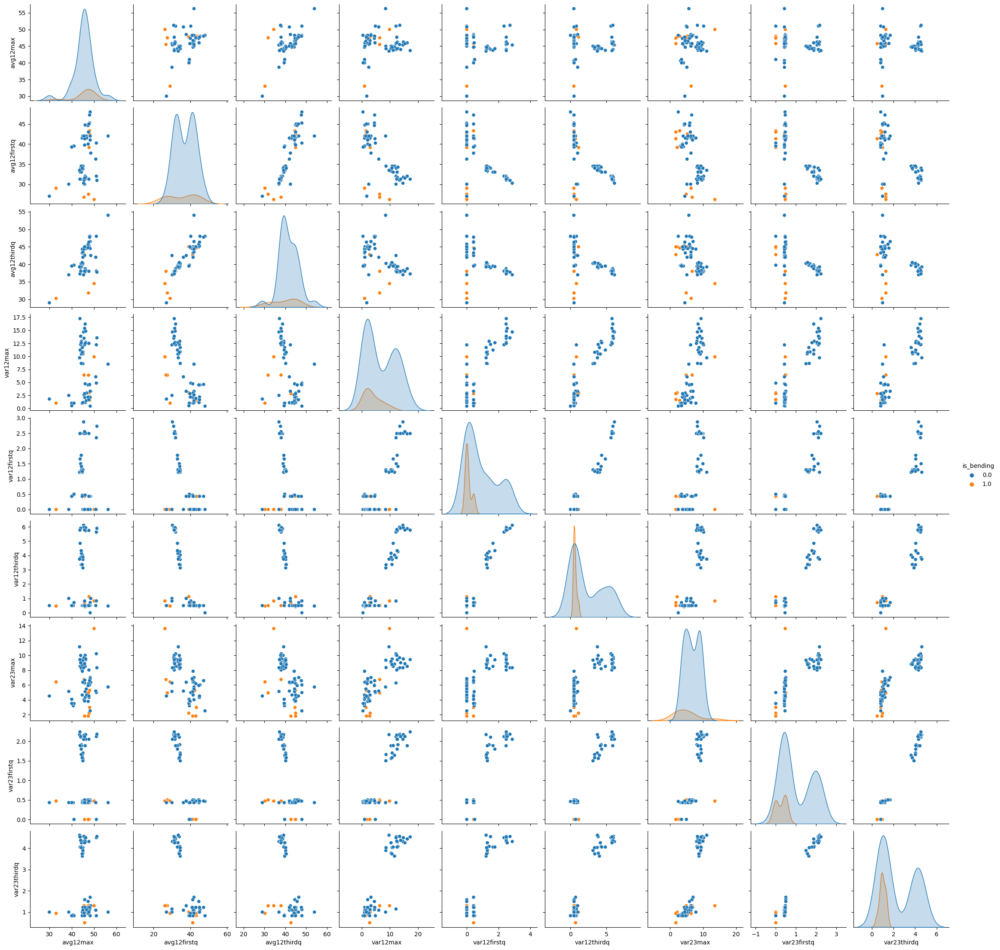

In [33]:
# [bending?, avg12_max, avg12_firstq, avg12_thirdq, var12_max, var12_firstq, var12_thirdq, var23_max, var23_firstq, var23_thirdq]

no_split_plot_data = []
for this_dfb in bending_train:
    avg12max = this_dfb.describe()["avg_rss12"]["max"]
    avg12firstq = this_dfb.describe()["avg_rss12"]["25%"]
    avg12thirdq = this_dfb.describe()["avg_rss12"]["75%"]

    var12max = this_dfb.describe()["var_rss12"]["max"]
    var12firstq = this_dfb.describe()["var_rss12"]["25%"]
    var12thirdq = this_dfb.describe()["var_rss12"]["75%"]

    var23max = this_dfb.describe()["var_rss23"]["max"]
    var23firstq = this_dfb.describe()["var_rss23"]["25%"]
    var23thirdq = this_dfb.describe()["var_rss23"]["75%"]

    no_split_plot_data.append([1.0, avg12max, avg12firstq, avg12thirdq, var12max, var12firstq, var12thirdq, var23max, var23firstq, var23thirdq])

for this_dfnb in not_bending_train:
    avg12max = this_dfnb.describe()["avg_rss12"]["max"]
    avg12firstq = this_dfnb.describe()["avg_rss12"]["25%"]
    avg12thirdq = this_dfnb.describe()["avg_rss12"]["75%"]

    var12max = this_dfnb.describe()["var_rss12"]["max"]
    var12firstq = this_dfnb.describe()["var_rss12"]["25%"]
    var12thirdq = this_dfnb.describe()["var_rss12"]["75%"]

    var23max = this_dfnb.describe()["var_rss23"]["max"]
    var23firstq = this_dfnb.describe()["var_rss23"]["25%"]
    var23thirdq = this_dfnb.describe()["var_rss23"]["75%"]

    no_split_plot_data.append([0.0, avg12max, avg12firstq, avg12thirdq, var12max, var12firstq, var12thirdq, var23max, var23firstq, var23thirdq])
#[3]
no_split_plot = pd.DataFrame(np.array(no_split_plot_data), columns=["is_bending", "avg12max", "avg12firstq", "avg12thirdq", "var12max", "var12firstq", "var12thirdq", "var23max", "var23firstq", "var23thirdq" ])

seaborn.pairplot(no_split_plot, hue="is_bending")

In the pair plots above, 0.0 (blue) represents non-bending activities, while 1.0 (orange) represents the bending activity.

#### ii. Splitted Plots

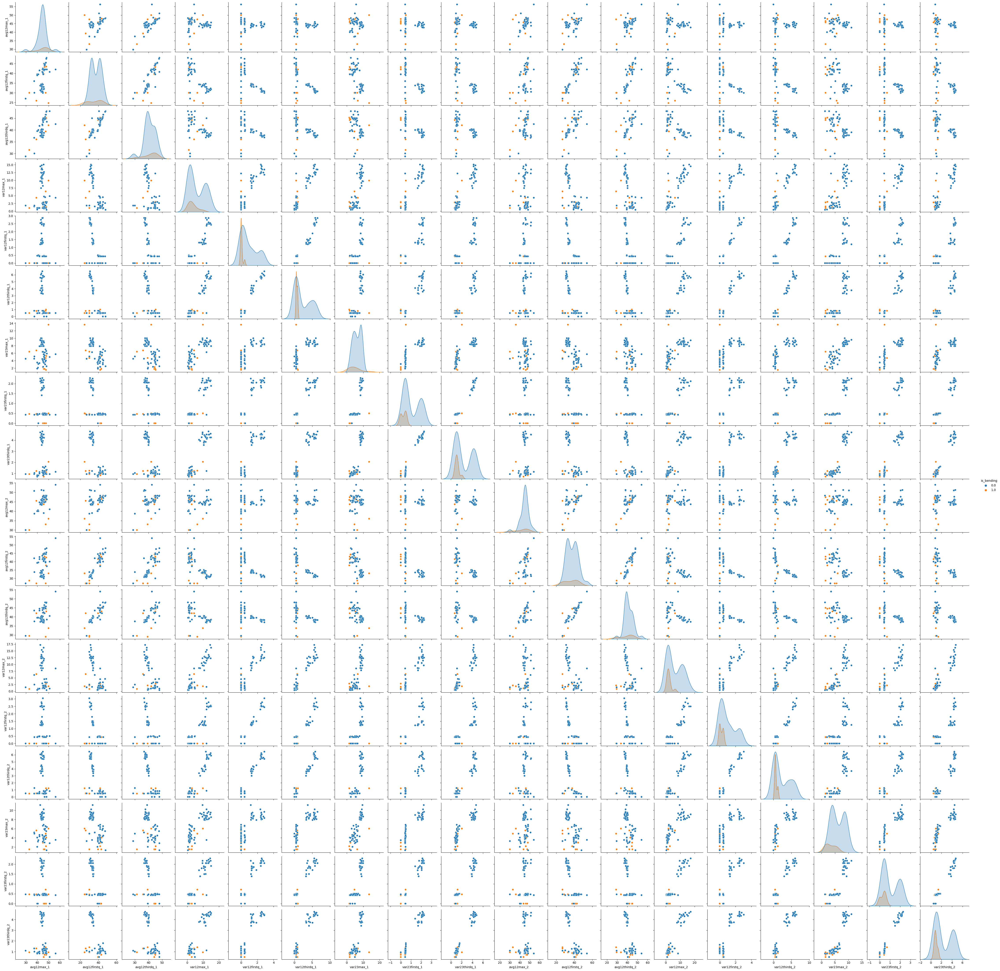

In [34]:
yes_split_plot_data = []

for this_dfb in bending_train:

    this_dfb_length = len(this_dfb)

    split_index = int(this_dfb_length / 2)

    first_half = this_dfb[:split_index]
    second_half = this_dfb[split_index:]

    avg12max_firsthalf = first_half.describe()["avg_rss12"]["max"]
    avg12firstq_firsthalf = first_half.describe()["avg_rss12"]["25%"]
    avg12thirdq_firsthalf = first_half.describe()["avg_rss12"]["75%"]

    var12max_firsthalf = first_half.describe()["var_rss12"]["max"]
    var12firstq_firsthalf = first_half.describe()["var_rss12"]["25%"]
    var12thirdq_firsthalf = first_half.describe()["var_rss12"]["75%"]

    var23max_firsthalf = first_half.describe()["var_rss23"]["max"]
    var23firstq_firsthalf = first_half.describe()["var_rss23"]["25%"]
    var23thirdq_firsthalf = first_half.describe()["var_rss23"]["75%"]

    #----------------------

    avg12max_secondhalf = second_half.describe()["avg_rss12"]["max"]
    avg12firstq_secondhalf = second_half.describe()["avg_rss12"]["25%"]
    avg12thirdq_secondhalf = second_half.describe()["avg_rss12"]["75%"]

    var12max_secondhalf = second_half.describe()["var_rss12"]["max"]
    var12firstq_secondhalf = second_half.describe()["var_rss12"]["25%"]
    var12thirdq_secondhalf = second_half.describe()["var_rss12"]["75%"]

    var23max_secondhalf = second_half.describe()["var_rss23"]["max"]
    var23firstq_secondhalf = second_half.describe()["var_rss23"]["25%"]
    var23thirdq_secondhalf = second_half.describe()["var_rss23"]["75%"]

    yes_split_plot_data.append([1.0, avg12max_firsthalf, avg12firstq_firsthalf, avg12thirdq_firsthalf, var12max_firsthalf, var12firstq_firsthalf, var12thirdq_firsthalf, var23max_firsthalf, var23firstq_firsthalf, var23thirdq_firsthalf, avg12max_secondhalf, avg12firstq_secondhalf, avg12thirdq_secondhalf, var12max_secondhalf, var12firstq_secondhalf, var12thirdq_secondhalf, var23max_secondhalf, var23firstq_secondhalf, var23thirdq_secondhalf])

for this_dfbn in not_bending_train:

    this_dfbn_length = len(this_dfbn)

    split_indexn = int(this_dfbn_length / 2)

    first_half = this_dfbn[:split_indexn]
    second_half = this_dfbn[split_indexn:]

    avg12max_firsthalf = first_half.describe()["avg_rss12"]["max"]
    avg12firstq_firsthalf = first_half.describe()["avg_rss12"]["25%"]
    avg12thirdq_firsthalf = first_half.describe()["avg_rss12"]["75%"]

    var12max_firsthalf = first_half.describe()["var_rss12"]["max"]
    var12firstq_firsthalf = first_half.describe()["var_rss12"]["25%"]
    var12thirdq_firsthalf = first_half.describe()["var_rss12"]["75%"]

    var23max_firsthalf = first_half.describe()["var_rss23"]["max"]
    var23firstq_firsthalf = first_half.describe()["var_rss23"]["25%"]
    var23thirdq_firsthalf = first_half.describe()["var_rss23"]["75%"]

    #----------------------

    avg12max_secondhalf = second_half.describe()["avg_rss12"]["max"]
    avg12firstq_secondhalf = second_half.describe()["avg_rss12"]["25%"]
    avg12thirdq_secondhalf = second_half.describe()["avg_rss12"]["75%"]

    var12max_secondhalf = second_half.describe()["var_rss12"]["max"]
    var12firstq_secondhalf = second_half.describe()["var_rss12"]["25%"]
    var12thirdq_secondhalf = second_half.describe()["var_rss12"]["75%"]

    var23max_secondhalf = second_half.describe()["var_rss23"]["max"]
    var23firstq_secondhalf = second_half.describe()["var_rss23"]["25%"]
    var23thirdq_secondhalf = second_half.describe()["var_rss23"]["75%"]

    yes_split_plot_data.append([0.0, avg12max_firsthalf, avg12firstq_firsthalf, avg12thirdq_firsthalf, var12max_firsthalf, var12firstq_firsthalf, var12thirdq_firsthalf, var23max_firsthalf, var23firstq_firsthalf, var23thirdq_firsthalf, avg12max_secondhalf, avg12firstq_secondhalf, avg12thirdq_secondhalf, var12max_secondhalf, var12firstq_secondhalf, var12thirdq_secondhalf, var23max_secondhalf, var23firstq_secondhalf, var23thirdq_secondhalf])
#[3]
yes_split_plot = pd.DataFrame(np.array(yes_split_plot_data), columns=["is_bending", "avg12max_1", "avg12firstq_1", "avg12thirdq_1", "var12max_1", "var12firstq_1", "var12thirdq_1", "var23max_1", "var23firstq_1", "var23thirdq_1", "avg12max_2", "avg12firstq_2", "avg12thirdq_2", "var12max_2", "var12firstq_2", "var12thirdq_2", "var23max_2", "var23firstq_2", "var23thirdq_2"])

seaborn.pairplot(yes_split_plot, hue="is_bending")

In the pair plots above, 0.0 (blue) represents non-bending activities, while 1.0 (orange) represents the bending activity.

For the feature labels, a suffix of "_1" means this is the first half of the time series. A suffix of "_2" means this is the second half of the time series.

Looking closely at the two pairplots, it doesn't appear as though there are any huge differences between the two pairplots, at least via visual inspection. I think this makes sense to a certain extent -- we're using the same data, the only exception is that we're splitting the training data into two separate halves. But other than that, we're not doing any sort of special transformation of the data.

#### iii. Time Series Segments

In [173]:
def get_col_names(l_value):
    time_series_name = ["avg12", "var12", "avg13", "var13", "avg23", "var23"]
    time_feature_name = ["min", "max", "mean", "median", "std", "firstq", "thirdq"]

    return_col_names = ["bending"]

    for i in range(l_value):
        for this_time_series in time_series_name:
            for this_time_feature in time_feature_name:
                new_col_name = this_time_series + "_" + this_time_feature + "_" + str(i + 1)
                return_col_names.append(new_col_name)

    return return_col_names

def get_time_features(this_df):
    avg_rss12_min = this_df.describe()["avg_rss12"]["min"]
    avg_rss12_max = this_df.describe()["avg_rss12"]["max"]
    avg_rss12_mean = this_df.describe()["avg_rss12"]["mean"]
    avg_rss12_median = this_df.describe()["avg_rss12"]["50%"]
    avg_rss12_std = this_df.describe()["avg_rss12"]["std"]
    avg_rss12_firstq = this_df.describe()["avg_rss12"]["25%"]
    avg_rss12_thirdq = this_df.describe()["avg_rss12"]["75%"]
    avg_rss12_all = [avg_rss12_min, avg_rss12_max, avg_rss12_mean, avg_rss12_median, avg_rss12_std, avg_rss12_firstq, avg_rss12_thirdq]

    var_rss12_min = this_df.describe()["var_rss12"]["min"]
    var_rss12_max = this_df.describe()["var_rss12"]["max"]
    var_rss12_mean = this_df.describe()["var_rss12"]["mean"]
    var_rss12_median = this_df.describe()["var_rss12"]["50%"]
    var_rss12_std = this_df.describe()["var_rss12"]["std"]
    var_rss12_firstq = this_df.describe()["var_rss12"]["25%"]
    var_rss12_thirdq = this_df.describe()["var_rss12"]["75%"]
    var_rss12_all = [var_rss12_min, var_rss12_max, var_rss12_mean, var_rss12_median, var_rss12_std, var_rss12_firstq, var_rss12_thirdq]

    avg_rss13_max = this_df.describe()["avg_rss13"]["max"]
    avg_rss13_min = this_df.describe()["avg_rss13"]["min"]
    avg_rss13_mean = this_df.describe()["avg_rss13"]["mean"]
    avg_rss13_median = this_df.describe()["avg_rss13"]["50%"]
    avg_rss13_std = this_df.describe()["avg_rss13"]["std"]
    avg_rss13_firstq = this_df.describe()["avg_rss13"]["25%"]
    avg_rss13_thirdq = this_df.describe()["avg_rss13"]["75%"]
    avg_rss13_all = [avg_rss13_min, avg_rss13_max, avg_rss13_mean, avg_rss13_median, avg_rss13_std, avg_rss13_firstq, avg_rss13_thirdq]

    var_rss13_min = this_df.describe()["var_rss13"]["min"]
    var_rss13_max = this_df.describe()["var_rss13"]["max"]
    var_rss13_mean = this_df.describe()["var_rss13"]["mean"]
    var_rss13_median = this_df.describe()["var_rss13"]["50%"]
    var_rss13_std = this_df.describe()["var_rss13"]["std"]
    var_rss13_firstq = this_df.describe()["var_rss13"]["25%"]
    var_rss13_thirdq = this_df.describe()["var_rss13"]["75%"]
    var_rss13_all = [var_rss13_min, var_rss13_max, var_rss13_mean, var_rss13_median, var_rss13_std, var_rss13_firstq, var_rss13_thirdq]

    avg_rss23_max = this_df.describe()["avg_rss23"]["max"]
    avg_rss23_min = this_df.describe()["avg_rss23"]["min"]
    avg_rss23_mean = this_df.describe()["avg_rss23"]["mean"]
    avg_rss23_median = this_df.describe()["avg_rss23"]["50%"]
    avg_rss23_std = this_df.describe()["avg_rss23"]["std"]
    avg_rss23_firstq = this_df.describe()["avg_rss23"]["25%"]
    avg_rss23_thirdq = this_df.describe()["avg_rss23"]["75%"]
    avg_rss23_all = [avg_rss23_min, avg_rss23_max, avg_rss23_mean, avg_rss23_median, avg_rss23_std, avg_rss23_firstq, avg_rss23_thirdq]

    var_rss23_min = this_df.describe()["var_rss23"]["min"]
    var_rss23_max = this_df.describe()["var_rss23"]["max"]
    var_rss23_mean = this_df.describe()["var_rss23"]["mean"]
    var_rss23_median = this_df.describe()["var_rss23"]["50%"]
    var_rss23_std = this_df.describe()["var_rss23"]["std"]
    var_rss23_firstq = this_df.describe()["var_rss23"]["25%"]
    var_rss23_thirdq = this_df.describe()["var_rss23"]["75%"]
    var_rss23_all = [var_rss23_min, var_rss23_max, var_rss23_mean, var_rss23_median, var_rss23_std, var_rss23_firstq, var_rss23_thirdq]

    return avg_rss12_all + var_rss12_all + avg_rss13_all + var_rss13_all + avg_rss23_all + var_rss23_all

def split_by_lvalue(original_df, l_value, bend_or_not):
    original_df_len = len(original_df)

    slice_len = int(original_df_len / l_value)

    split_array = [0]
    for i in range(l_value - 1):
        split_array.append((i + 1) * slice_len)

    split_array = split_array + [original_df_len]

    expanded_features = [bend_or_not]
    for j in range(len(split_array) - 1):

        new_split_df = original_df[split_array[j]:split_array[j+1]]

        new_split_features = get_time_features(new_split_df)

        expanded_features = expanded_features + new_split_features

    return expanded_features


In [135]:
# random.seed(101)
# test_array = [1,2,3,4,5,6,7,8,9,10]
# random.shuffle(test_array)
# print(test_array)

testlistex = [1,2,3]
testlistex.pop(0)
print(testlistex)

[2, 3]


In [190]:
my_raw_dfs =[]
for l_value_input in range(1,21):

    print("L VALUE", l_value_input)

    list_all_features = []

    for this_dfb_train in bending_train:
        this_dfb_features = split_by_lvalue(this_dfb_train, l_value_input, 1.0)

        list_all_features.append(this_dfb_features)

    for this_dfbn_train in not_bending_train:
        this_dfbn_features = split_by_lvalue(this_dfbn_train, l_value_input, 0.0)

        list_all_features.append(this_dfbn_features)

    #Make new df from the features

    this_col_names = get_col_names(l_value_input)

    #[5]
    random.seed(101)
    #[6]
    random.shuffle(list_all_features)

    #[3]
    l_value_df = pd.DataFrame(data=np.array(list_all_features), columns=this_col_names)

    my_raw_dfs.append(l_value_df)
    

L VALUE 1
L VALUE 2
L VALUE 3
L VALUE 4
L VALUE 5
L VALUE 6
L VALUE 7
L VALUE 8
L VALUE 9
L VALUE 10
L VALUE 11
L VALUE 12
L VALUE 13
L VALUE 14
L VALUE 15
L VALUE 16
L VALUE 17
L VALUE 18
L VALUE 19
L VALUE 20


In [276]:
#[9]
my_raw_dfs_copy = copy.deepcopy(my_raw_dfs)

In [277]:
stored_logit_results = {}

for i in range(1,21):
    print(i)

    curr_df = my_raw_dfs_copy[i - 1]

    my_col_names = get_col_names(i)

    l_value_df_dependent = curr_df["bending"]

    my_col_names.pop(0)

    l_value_df_independent = curr_df[my_col_names]

    feature_length = int(len(l_value_df_independent))

    inner_stored_logit_results = []

    #[8]
    l_value_logit_model = LogisticRegression(C=100000.0)

    for this_p_value in range(1, feature_length):
        #[4]
        l_value_rfe = RFE(estimator=l_value_logit_model, n_features_to_select=this_p_value)
        l_value_rfe = l_value_rfe.fit(X=l_value_df_independent, y=l_value_df_dependent)

        #[7] #stratified cross validation automatically used.
        this_cv_score = cross_val_score(estimator=l_value_rfe, X=l_value_df_independent, y=l_value_df_dependent, cv=5)
        inner_stored_logit_results.append(this_cv_score.mean())

    stored_logit_results[str(i)] = inner_stored_logit_results

    print(inner_stored_logit_results)
    break

1
[0.9274725274725275, 0.9285714285714285, 0.9714285714285715, 0.9714285714285715, 0.9857142857142858, 1.0, 1.0, 1.0, 1.0, 0.9857142857142858, 0.9857142857142858, 0.9857142857142858, 0.9857142857142858, 0.9857142857142858, 0.9857142857142858, 0.9857142857142858, 0.9857142857142858, 0.9857142857142858, 0.9857142857142858, 0.9857142857142858, 0.9857142857142858, 0.9857142857142858, 0.9857142857142858, 0.9857142857142858, 0.9857142857142858, 0.9714285714285715, 0.9857142857142858, 0.9857142857142858, 0.9714285714285715, 0.9857142857142858, 0.9857142857142858, 0.9857142857142858, 0.9857142857142858, 0.9857142857142858, 0.9857142857142858, 0.9857142857142858, 0.9857142857142858, 0.9857142857142858, 0.9857142857142858, 0.9857142857142858, 0.9857142857142858, 0.9857142857142858, 0.9857142857142858, 0.9857142857142858, 0.9857142857142858, 0.9857142857142858, 0.9857142857142858, 0.9857142857142858, 0.9857142857142858, 0.9857142857142858, 0.9857142857142858, 0.9857142857142858, 0.985714285714285

In this part, I used cross validation to figure out what the best parameters are. The best parameters I found was l = 1 and p = 6. (One time series, using the 6 best parameters.)

I used backward selection with sklearn.feature_selection for finding which parameters I should use.

To do this correctly, I first ensured that my initial dataframe is shuffled. This is important because initially my data had the bending activities first and then the non-bending activities. Shuffling helps make cross validation work.

I also made C (the budget) in the model very very very large such that the effect of L2 regularization is removed.

Lastly I also used stratified cross validation. This ensures that in each fold the ratio of categories for classification are roughly the same as the overall training data. Researching SK Learn, I learned that when you specify the number of folds using an integer, SK Learn uses stratified cross validation automatically [10].

The wrong way would be to not shuffle your dataframe so your labeled data are clumped together, to not make C very large so that you do not reduce the effect of L2 regularization, and you do not use stratified cross validation. As for the last part, given how few datapoints there are of "bending" as compared to everything else, there will be a class imbalance. Stratified cross validation helps ensure that cross validation will be useful, as it will ensure that each fold will have the same ratio of labels as the overall dataset.

In [278]:
test_curr_df = my_raw_dfs_copy[0]
trainY = test_curr_df["bending"]

test_col_names = get_col_names(1)
test_col_names.pop(0)
trainX = test_curr_df[test_col_names]
#[8]
test_logit_model = LogisticRegression(C=100000.0)
#[4]
trainRFE = RFE(estimator=test_logit_model, n_features_to_select=6)
trainRFE = trainRFE.fit(X=trainX, y=trainY)
#[7]
test_CV_score = cross_val_score(estimator=trainRFE, X=trainX, y=trainY, cv=5)
print(test_CV_score.mean())
print(trainRFE.get_feature_names_out(test_col_names))


1.0
['avg12_mean_1' 'avg12_thirdq_1' 'var12_max_1' 'avg23_min_1' 'avg23_max_1'
 'avg23_firstq_1']


(The above test code is just to make sure that my found parameters give the best result.)

#### iv. Confusion Matrix

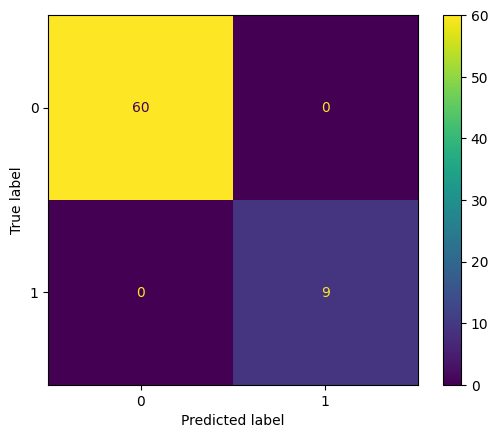

In [279]:
train_RFE_prediction = trainRFE.predict(X=trainX)
#[11]
train_CM_grid = metrics.confusion_matrix(y_true=trainY, y_pred=train_RFE_prediction)
train_CM_display = metrics.ConfusionMatrixDisplay(confusion_matrix=train_CM_grid)
train_CM_display.plot()

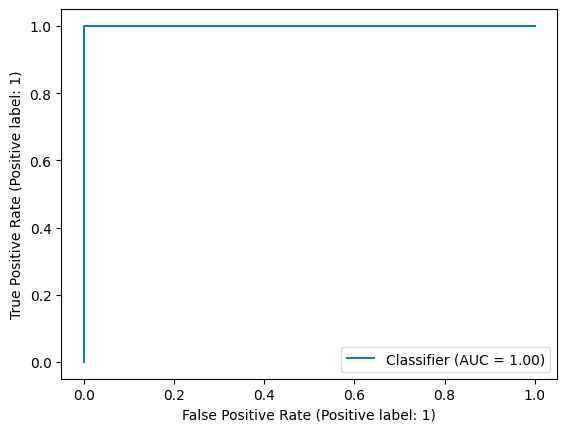

In [280]:
#[12]
metrics.RocCurveDisplay.from_predictions(y_true=trainY, y_pred=train_RFE_prediction)

In [281]:
#[13]
train_AUC_score = metrics.roc_auc_score(y_true=trainY, y_score=trainRFE.decision_function(trainX))
print("My AUC Score:", train_AUC_score)

My AUC Score: 1.0


In [282]:
#[4] [14]
print(trainX.loc[:, trainRFE.support_])
print(trainRFE.estimator_.coef_)

    avg12_mean_1  avg12_thirdq_1  var12_max_1  avg23_min_1  avg23_max_1   
0      34.473188           38.00        13.86         4.67        23.25  \
1      42.728854           44.50         4.72         2.00        24.00   
2      37.177042           40.25         8.58         7.00        25.50   
3      42.282667           44.33         1.00         0.00        23.25   
4      34.873229           38.25        14.82         5.50        23.50   
..           ...             ...          ...          ...          ...   
64     34.322750           38.00        13.47         6.25        23.25   
65     29.881938           30.27         1.00        11.00        23.25   
66     35.193333           38.75        16.20         6.25        23.50   
67     46.224938           48.00         4.50         2.50        21.00   
68     39.667833           39.75         1.00         0.00        14.50   

    avg23_firstq_1  
0          13.7300  
1          13.7300  
2          17.9500  
3           8.5

Coefficients:

avg12_mean_1: -1.45852054

avg12_thirdq_1: -1.67017907

var12_max_1: -1.97529004

arg23_min_1: 2.53124535

avg23_max_1: 2.87724453

avg23_firstq_1: 1.77054518



#### v. Test Classifier

In [307]:
list_all_features_test = []

for this_dfb_test in bending_test:
    this_dfb_features_test = split_by_lvalue(this_dfb_test, 1, 1.0)

    list_all_features_test.append(this_dfb_features_test)

for this_dfbn_test in not_bending_test:
    this_dfbn_features_test = split_by_lvalue(this_dfbn_test, 1, 0.0)

    list_all_features_test.append(this_dfbn_features_test)

this_col_names_test = get_col_names(1)

#[5]
random.seed(101)
#[6]
random.shuffle(list_all_features_test)

#[3]
test_df = pd.DataFrame(data=np.array(list_all_features_test), columns=this_col_names_test)

testY = test_df["bending"]

this_col_names_test.pop(0)

testX = test_df[this_col_names_test]

test_predY = trainRFE.predict(X=testX)

#[15]
test_acc_score = metrics.accuracy_score(y_true=testY, y_pred=test_predY)

print(test_acc_score)

1.0


The test accuracy that I got for this part was 1.0, or 100%. This was the same accuracy I got using cross-validation, which was also 1.0 or 100%.

#### vi. Separation

Looking at the classes and data, I do not think the data is well separated to cause any issues with the calculation of the regression parameters. While training/fitting the model, I did not get any error messages noting that we had exceeded the maximum number of iterations. Furthermore, looking at the splitplots above, where orange and blue color code the dots depending on if it's bending or not bending, there never appeared any plot where there was a distinct orange area and a distinct blue area -- most of the dots were all mixed together regardless of color.

#### vii. Imbalance

Yes I do see class imbalance in the confusion matrix above. Thus, I'll try to use case-control sampling to see if that'll work too.

0.08993769914272942


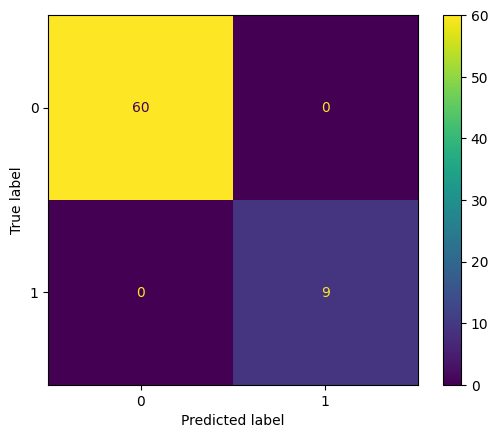

In [288]:
#[16]

original_b_0 = float(trainRFE.estimator_.intercept_)

#For pi_value, I'm going to assume pi is going to be the actual prevalence of "bending" across the entire dataset (training and testing).
all_bending_num = float(len(bending_train + bending_test))
all_num = float(len(data_all))

pi_value = all_bending_num / all_num

#For pi_tilde_value, I'm going to assume pi_tilde is going to be the prevalence of "bending" within the training set only.
train_bending_num = float(len(bending_train))
train_num = float(len(bending_train + not_bending_train))

pi_tilde_value = train_bending_num / train_num

new_b_0 = original_b_0 + np.log( (pi_value) / (1.0 - pi_value)) - np.log( (pi_tilde_value) / (1.0 - pi_tilde_value))

print(new_b_0)

#[8]
case_control_model = LogisticRegression(C=100000.0, intercept_scaling=new_b_0)

#[4]
case_control_RFE = RFE(estimator=case_control_model, n_features_to_select=6)
case_control_RFE = case_control_RFE.fit(X=trainX, y=trainY)

case_control_RFE_prediction = case_control_RFE.predict(X=trainX)
#[11]
case_control_CM_grid = metrics.confusion_matrix(y_true=trainY, y_pred=case_control_RFE_prediction)
case_controll_CM_display = metrics.ConfusionMatrixDisplay(confusion_matrix=case_control_CM_grid)
train_CM_display.plot()

# train_RFE_prediction = trainRFE.predict(X=trainX)
# #[11]
# train_CM_grid = metrics.confusion_matrix(y_true=trainY, y_pred=train_RFE_prediction)
# train_CM_display = metrics.ConfusionMatrixDisplay(confusion_matrix=train_CM_grid)
# train_CM_display.plot()

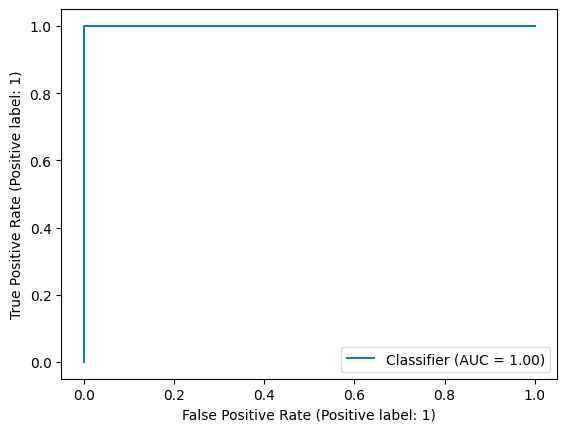

In [289]:
#[12]
metrics.RocCurveDisplay.from_predictions(y_true=trainY, y_pred=case_control_RFE_prediction)

In [290]:
#[13]
case_control_AUC_score = metrics.roc_auc_score(y_true=trainY, y_score=case_control_RFE.decision_function(trainX))
print("My AUC Score:", case_control_AUC_score)

My AUC Score: 1.0


### (b) Binary Classification Using L1-penalized logistic regression

#### i. Time Series Segments

In [306]:
stored_l1_results = []

for i in range(1,21):

    l1_df = my_raw_dfs_copy[i - 1]

    l1_col_names = get_col_names(i)

    l1_dependent = l1_df["bending"]

    l1_col_names.pop(0)

    l1_independent = l1_df[l1_col_names]

    #[17] [18]
    l1_pipe = pipeline.make_pipeline(preprocessing.Normalizer(), preprocessing.StandardScaler(), LogisticRegressionCV(cv=5, penalty="l1", solver="liblinear"))

    this_l1_model = l1_pipe.fit(X=l1_independent, y=l1_dependent)

    stored_l1_results.append(this_l1_model.score(X=l1_independent, y=l1_dependent))

print("Maximum Accuracy:",np.max(stored_l1_results))
print("Maximum Accuracy Index:",np.argmax(stored_l1_results))

Maximum Accuracy: 1.0
Maximum Accuracy Index: 0


In the above problem, I Normalized and Standardized my data, and ran a LogisticRegression and cross validation model. This cross validation model had 5 cross folds, used the L1 penalty, and used liblinear as its solver. I then fitted the model with the independent and dependent data, which has a different number of columns/features depending on the number of time series splits (the i variable in the for loop).

I found that the i value that had the best accuracy was when i = 0 --> or when there was no time series split (i.e. l = 1).

#### ii. Comparison

In [313]:
test_l1_df = my_raw_dfs_copy[0]

test_l1_names = get_col_names(1)

test_l1_dependent = test_l1_df["bending"]

test_l1_names.pop(0)

test_l1_independent = test_l1_df[test_l1_names]

#[17] [18]
l1_test_pipe = pipeline.make_pipeline(preprocessing.Normalizer(), preprocessing.StandardScaler(), LogisticRegressionCV(cv=5, penalty="l1", solver="liblinear"))

l1_test_model = l1_test_pipe.fit(X=test_l1_independent, y=test_l1_dependent)

l1_test_pred = l1_test_model.predict(X=testX)

#[15]
test_l1_acc_score = metrics.accuracy_score(y_true=testY, y_pred=l1_test_pred)

print(test_l1_acc_score)

1.0


The L1-penalized classifier that I trained above had the same test accuracy as the p-value classifier -- both had an acuraccy of 1.0, or 100%. Thus, performance-wise, they performed equally well on the test set.

However the L1-penalized classifier was much much MUCH easier and quicker to train and set up. Setting up and training the p-value classifier took a ton of work and time. So the L1-penalized classifier was way easier.

### (c) Multi-class Classification (The Realistic Case)

#### i. Time Series Segments

In [315]:
#training

multi_dfs =[]
for l_value_input in range(1,21):

    print("L VALUE", l_value_input)

    list_all_features = []

    for this_dfb_train in bending_train:
        this_dfb_features = split_by_lvalue(this_dfb_train, l_value_input, 0.0)

        list_all_features.append(this_dfb_features)

    for this_dfbn_train in cycling_train:
        this_dfbn_features = split_by_lvalue(this_dfbn_train, l_value_input, 1.0)

        list_all_features.append(this_dfbn_features)

    for this_dfbn_train in lying_train:
        this_dfbn_features = split_by_lvalue(this_dfbn_train, l_value_input, 2.0)

        list_all_features.append(this_dfbn_features)

    for this_dfbn_train in sitting_train:
        this_dfbn_features = split_by_lvalue(this_dfbn_train, l_value_input, 3.0)

        list_all_features.append(this_dfbn_features)

    for this_dfbn_train in standing_train:
        this_dfbn_features = split_by_lvalue(this_dfbn_train, l_value_input, 4.0)

        list_all_features.append(this_dfbn_features)

    for this_dfbn_train in walking_train:
        this_dfbn_features = split_by_lvalue(this_dfbn_train, l_value_input, 5.0)

        list_all_features.append(this_dfbn_features)

    #Make new df from the features

    this_col_names = get_col_names(l_value_input)

    #[5]
    random.seed(101)
    #[6]
    random.shuffle(list_all_features)

    #[3]
    l_value_df = pd.DataFrame(data=np.array(list_all_features), columns=this_col_names)

    multi_dfs.append(l_value_df)

L VALUE 1
L VALUE 2
L VALUE 3
L VALUE 4
L VALUE 5
L VALUE 6
L VALUE 7
L VALUE 8
L VALUE 9
L VALUE 10
L VALUE 11
L VALUE 12
L VALUE 13
L VALUE 14
L VALUE 15
L VALUE 16
L VALUE 17
L VALUE 18
L VALUE 19
L VALUE 20


In [318]:
stored_multi_results = []

for i in range(1,21):

    multi_df = multi_dfs[i - 1]

    multi_col_names = get_col_names(i)

    multi_dependent = multi_df["bending"]

    print(multi_dependent)

    multi_col_names.pop(0)

    multi_independent = multi_df[multi_col_names]

    #[17] [18]
    multi_pipe = pipeline.make_pipeline(preprocessing.Normalizer(), preprocessing.StandardScaler(), LogisticRegressionCV(cv=5, penalty="l1", solver="liblinear"))

    this_multi_model = multi_pipe.fit(X=multi_independent, y=multi_dependent)

    stored_multi_results.append(this_multi_model.score(X=multi_independent, y=multi_dependent))

print("Maximum Accuracy:",np.max(stored_multi_results))
print("Maximum Accuracy Index:",np.argmax(stored_multi_results))

0     5.0
1     3.0
2     1.0
3     3.0
4     5.0
     ... 
64    5.0
65    0.0
66    5.0
67    4.0
68    2.0
Name: bending, Length: 69, dtype: float64
0     5.0
1     3.0
2     1.0
3     3.0
4     5.0
     ... 
64    5.0
65    0.0
66    5.0
67    4.0
68    2.0
Name: bending, Length: 69, dtype: float64
0     5.0
1     3.0
2     1.0
3     3.0
4     5.0
     ... 
64    5.0
65    0.0
66    5.0
67    4.0
68    2.0
Name: bending, Length: 69, dtype: float64
0     5.0
1     3.0
2     1.0
3     3.0
4     5.0
     ... 
64    5.0
65    0.0
66    5.0
67    4.0
68    2.0
Name: bending, Length: 69, dtype: float64
0     5.0
1     3.0
2     1.0
3     3.0
4     5.0
     ... 
64    5.0
65    0.0
66    5.0
67    4.0
68    2.0
Name: bending, Length: 69, dtype: float64
0     5.0
1     3.0
2     1.0
3     3.0
4     5.0
     ... 
64    5.0
65    0.0
66    5.0
67    4.0
68    2.0
Name: bending, Length: 69, dtype: float64
0     5.0
1     3.0
2     1.0
3     3.0
4     5.0
     ... 
64    5.0
65    0.0
66    5.

It appears that the best l to use is when l = 2 (split time series once).

In [321]:
# best train model
best_multi_df = multi_dfs[1]
best_multi_col_names = get_col_names(2)
best_multi_dependent = best_multi_df["bending"]
best_multi_col_names.pop(0)
best_multi_independent = multi_df[best_multi_col_names]

#[17] [18]
best_multi_pipe = pipeline.make_pipeline(preprocessing.Normalizer(), preprocessing.StandardScaler(), LogisticRegressionCV(cv=5, penalty="l1", solver="liblinear"))
best_multi_model = best_multi_pipe.fit(X=best_multi_independent, y=best_multi_dependent)

multi_all_features_test = []

for this_dfb_test in bending_test:
    this_dfb_features_test = split_by_lvalue(this_dfb_test, 2, 0.0)

    multi_all_features_test.append(this_dfb_features_test)

for this_dfbn_test in cycling_test:
    this_dfbn_features_test = split_by_lvalue(this_dfbn_test, 2, 1.0)

    multi_all_features_test.append(this_dfbn_features_test)

for this_dfbn_test in lying_test:
    this_dfbn_features_test = split_by_lvalue(this_dfbn_test, 2, 2.0)

    multi_all_features_test.append(this_dfbn_features_test)

for this_dfbn_test in sitting_test:
    this_dfbn_features_test = split_by_lvalue(this_dfbn_test, 2, 3.0)

    multi_all_features_test.append(this_dfbn_features_test)

for this_dfbn_test in standing_test:
    this_dfbn_features_test = split_by_lvalue(this_dfbn_test, 2, 4.0)

    multi_all_features_test.append(this_dfbn_features_test)

for this_dfbn_test in walking_test:
    this_dfbn_features_test = split_by_lvalue(this_dfbn_test, 2, 5.0)

    multi_all_features_test.append(this_dfbn_features_test)

multi_col_names_test = get_col_names(2)

#[5]
random.seed(101)
#[6]
random.shuffle(multi_all_features_test)

#[3]
multi_test_df = pd.DataFrame(data=np.array(multi_all_features_test), columns=multi_col_names_test)

multi_testY = multi_test_df["bending"]

multi_col_names_test.pop(0)

multi_testX = multi_test_df[multi_col_names_test]

multi_test_predY = best_multi_model.predict(X=multi_testX)

#[15]
multi_test_acc_score = metrics.accuracy_score(y_true=multi_testY, y_pred=multi_test_predY)

print("Test Error is:", 1.0 - multi_test_acc_score)

Test Error is: 0.3157894736842105


Test Error is: 0.3157894736842105 (31.6%)

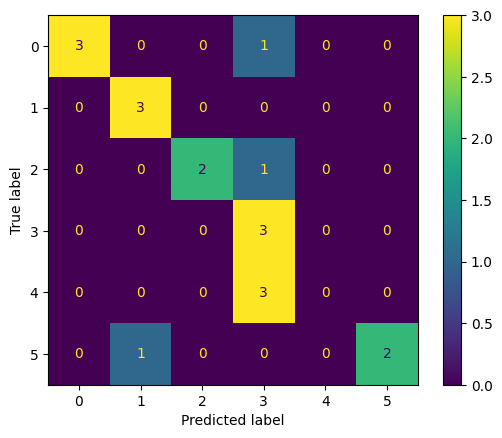

In [327]:
#[11]
multi_CM_grid = metrics.confusion_matrix(y_true=multi_testY, y_pred=multi_test_predY, labels=[0.0, 1.0, 2.0, 3.0, 4.0, 5.0])
multi_CM_display = metrics.ConfusionMatrixDisplay(confusion_matrix=multi_CM_grid)
multi_CM_display.plot()

Label Legend:

0 -- Bending

1 -- Cycling

2 -- Lying

3 -- Sitting

4 -- Standing

5 -- Walking



I was not able to install R to run pROC. Thus, it's not possible for me to get the ROC curve.

#### ii. Naive Bayes

GAUSSIAN NB ERROR AND CONFUSION MATRIX

Gaussian NB Test Error is: 0.26315789473684215


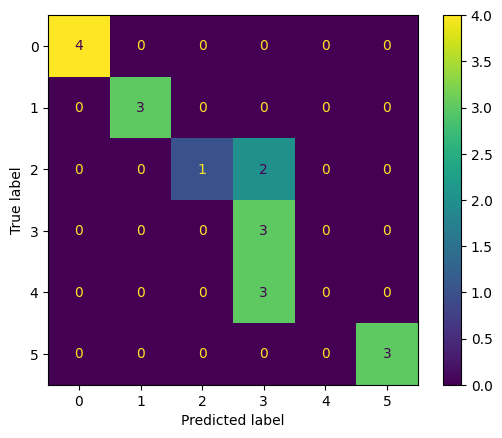

In [347]:
#[17] [18]
gaus_pipeline = pipeline.make_pipeline(preprocessing.Normalizer(), preprocessing.StandardScaler(), GaussianNB()) #[19]
multi_gaus_NB = gaus_pipeline.fit(X=best_multi_independent, y=best_multi_dependent)
multi_gaus_NB_predY = multi_gaus_NB.predict(X=multi_testX)

#[15]
multi_gaus_NB_acc = metrics.accuracy_score(y_true=multi_testY, y_pred=multi_gaus_NB_predY)

print("Gaussian NB Test Error is:", 1.0 - multi_gaus_NB_acc)

#[11]
gaus_CM_grid = metrics.confusion_matrix(y_true=multi_testY, y_pred=multi_gaus_NB_predY, labels=[0.0, 1.0, 2.0, 3.0, 4.0, 5.0])
gaus_CM_display = metrics.ConfusionMatrixDisplay(confusion_matrix=gaus_CM_grid)
gaus_CM_display.plot()

Gaussian NB Test Error is: 0.26315789473684215 (26.3%)

MULTINOMIAL NB ERROR AND CONFUSION MATRIX

Multinomial NB Test Error is: 0.6842105263157895


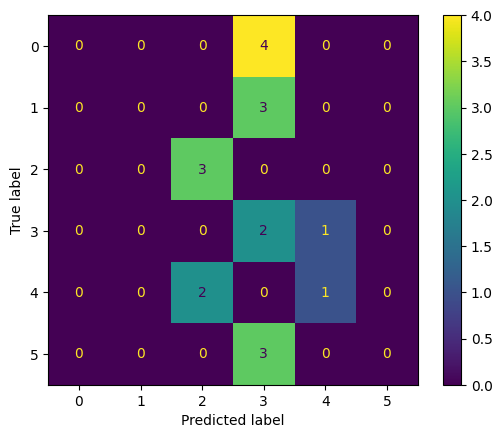

In [349]:
#[17] [18]
multinomial_pipeline = pipeline.make_pipeline(preprocessing.Normalizer(), MultinomialNB()) #[19]
multinomial_NB = multinomial_pipeline.fit(X=best_multi_independent, y=best_multi_dependent)
multinomial_NB_predY = multinomial_NB.predict(X=multi_testX)

#[15]
multinomial_NB_acc = metrics.accuracy_score(y_true=multi_testY, y_pred=multinomial_NB_predY)

print("Multinomial NB Test Error is:", 1.0 - multinomial_NB_acc)

#[11]
multinomial_CM_grid = metrics.confusion_matrix(y_true=multi_testY, y_pred=multinomial_NB_predY, labels=[0.0, 1.0, 2.0, 3.0, 4.0, 5.0])
multinomial_CM_display = metrics.ConfusionMatrixDisplay(confusion_matrix=multinomial_CM_grid)
multinomial_CM_display.plot()

Multinomial NB Test Error rate is: 0.6842105263157895 (68.4%)

#### ii. Comparison

Looking at the results, the L1 penalized multinomial regression model had a test error rate of about 31.6%.

The Gaussian NB had a test error rate of about 26.3%.

And the Multinomial NB had a test error rate of about 68.4%.

Thus, I would say that for multiclass classification for this problem, I would choose Gaussian Naive Bayes, as that method had the lowest error rate of only 26.3%.

## 3. ISLR 4.8.3

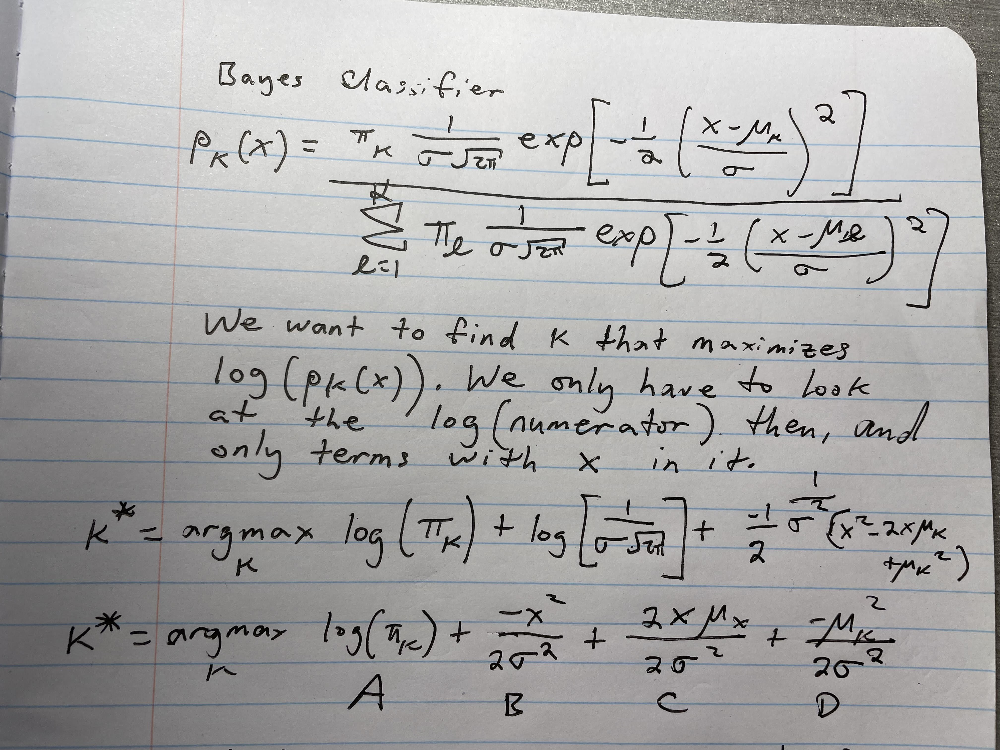

In LDA, term B (the x^2 term) can be eliminated, as sigma^2 is the same for all classes. Thus, for a given x value, term B will be the same for all classes, and thus, will have no bearing on determining what is the best k value. Thus, we can safely remove the term. This will leave us with a discriminant function that has no x^2 term, and will thus be a linear function.

However, in QDA, we cannot make the assumption that sigma^2 is the same for all classes. Thus, for different values of k (different classes), there will be a different sigma^2 value. Thus, term B could be different for all of the classes, and thus, could have a bearing on determining what is the best k. We cannot safely remove the term, as the term could affect our determination of the best k value. Thus, we need term B, and thus our discriminant function will have a quadratic term (x^2 term), and thus, our discriminant function will be quadratic.

## 4. ISLR 4.8.7

Bayes's Theorem states that (from ISLR textbook pg 142)

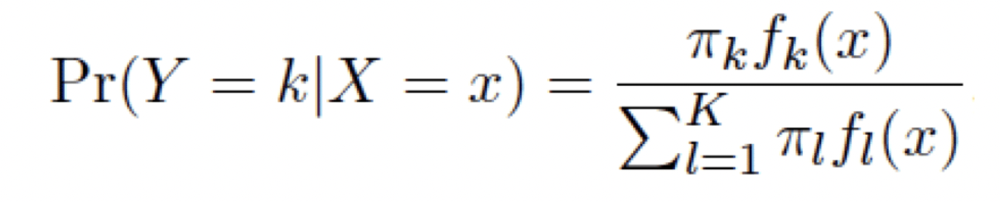

In this problem, we have two classes -- a company provides a dividend (YES), or does not provide a dividend (NO).

Last year, 80% of companies issued dividends. This can be used to calculate our priors.

Pr(Y = YES) = pi_YES = 0.8

PR(Y = NO) = pi_NO = 0.2

(from ISLR textbook pg 191)

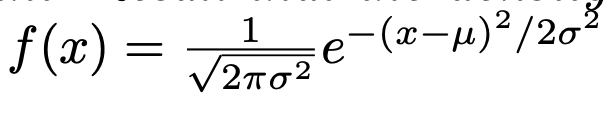

Next, we need to calculate the probability density values for class YES and for class NO when x = 4 using the normal distribution (see above equation).

Class YES: Mean = 10 (mu)

Class NO: Mean = 0 (mu)

Variance: 36 (sigma^2)

Thus:

f_YES(4) = (2*pi*36)^(-0.5) * EXP(−(4−10)^2/(2*36))

f_NO(4) = (2*pi*36)^(-0.5) * EXP(−(4−0)^2/(2*36))

Using a calculator, I get:

f_YES(4) is about 0.040328454

f_NO(4) is about 0.053241334

Thus, plugging it all together, we get 

Pr(YES | x = 4) = (0.8 * f_YES(4)) / (0.8 * f_YES(4) + 0.2 * f_NO(4))

Which is about 0.751852454

or about 75.2% probability that the company will issue a dividend this year.



## 5.1. Extra Practice ISLR 4.8.4

## 5.2. Extra Practice ISLR 4.8.9

References:

[1] https://www.geeksforgeeks.org/how-to-iterate-over-files-in-directory-using-python/#

[2] https://www.w3schools.com/python/pandas/pandas_csv.asp

[3] https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.html

[4] https://scikit-learn.org/stable/modules/generated/sklearn.feature_selection.RFE.html

[5] https://www.w3schools.com/python/ref_random_seed.asp

[6] https://www.w3schools.com/python/ref_random_shuffle.asp

[7] https://scikit-learn.org/stable/modules/cross_validation.html

[8] https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LogisticRegression.html

[9] https://www.dataquest.io/blog/python-copy-list/

[10] https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.cross_val_score.html#sklearn.model_selection.cross_val_score

[11] https://scikit-learn.org/stable/modules/generated/sklearn.metrics.confusion_matrix.html

[12] https://scikit-learn.org/stable/modules/generated/sklearn.metrics.RocCurveDisplay.html#sklearn.metrics.RocCurveDisplay.from_predictions

[13] https://scikit-learn.org/stable/modules/generated/sklearn.metrics.roc_auc_score.html#sklearn.metrics.roc_auc_score

[14] https://towardsdatascience.com/powerful-feature-selection-with-recursive-feature-elimination-rfe-of-sklearn-23efb2cdb54e

[15] https://scikit-learn.org/stable/modules/generated/sklearn.metrics.accuracy_score.html

[16] Using information from Lesson 3, Slide 63 and 64

[17] https://scikit-learn.org/stable/modules/preprocessing.html

[18] https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LogisticRegressionCV.html

[19] https://scikit-learn.org/stable/modules/naive_bayes.html